In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import pandas as pd
import numpy as np

df=pd.read_csv('train.csv')

In [2]:
df.head()

,loan_id,source,financial_institution,interest_rate,unpaid_principal_bal,loan_term,origination_date,first_payment_date,loan_to_value,number_of_borrowers,...,m4,m5,m6,m7,m8,m9,m10,m11,m12,m13
0,2.680550e+11,Z,"Turner, Baldwin and Rhodes",4.250,214000,360,01/03/2012,May-12,95,1,...,0,0,0,1,0,0,0,0,0,1
1,6.728320e+11,Y,"Swanson, Newton and Miller",4.875,144000,360,01/01/2012,Mar-12,72,1,...,0,0,0,0,0,0,0,1,0,1
2,7.425150e+11,Z,Thornton-Davis,3.250,366000,180,01/01/2012,Mar-12,49,1,...,0,0,0,0,0,0,0,0,0,1
3,6.013860e+11,X,OTHER,4.750,135000,360,01/02/2012,Apr-12,46,2,...,0,0,0,0,0,1,1,1,1,1
4,2.738700e+11,X,OTHER,4.750,124000,360,01/02/2012,Apr-12,80,1,...,3,4,5,6,7,8,9,10,11,1


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 116058 entries, 0 to 116057
Data columns (total 29 columns):
loan_id                     116058 non-null float64
source                      116058 non-null object
financial_institution       116058 non-null object
interest_rate               116058 non-null float64
unpaid_principal_bal        116058 non-null int64
loan_term                   116058 non-null int64
origination_date            116058 non-null object
first_payment_date          116058 non-null object
loan_to_value               116058 non-null int64
number_of_borrowers         116058 non-null int64
debt_to_income_ratio        116058 non-null int64
borrower_credit_score       116058 non-null int64
loan_purpose                116058 non-null object
insurance_percent           116058 non-null int64
co-borrower_credit_score    116058 non-null int64
insurance_type              116058 non-null int64
m1                          116058 non-null int64
m2                          11

# EDA

(array([0, 1, 2]), <a list of 3 Text xticklabel objects>)

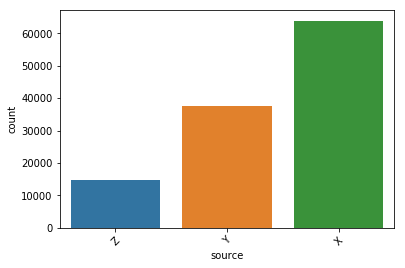

In [5]:

sns.countplot(x="source", data=df)
plt.xticks(rotation =45)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18]), <a list of 19 Text xticklabel objects>)

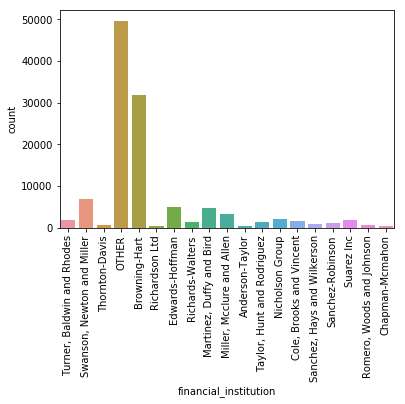

In [8]:
sns.countplot(x="financial_institution", data=df)
plt.xticks(rotation =90)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18]), <a list of 19 Text xticklabel objects>)

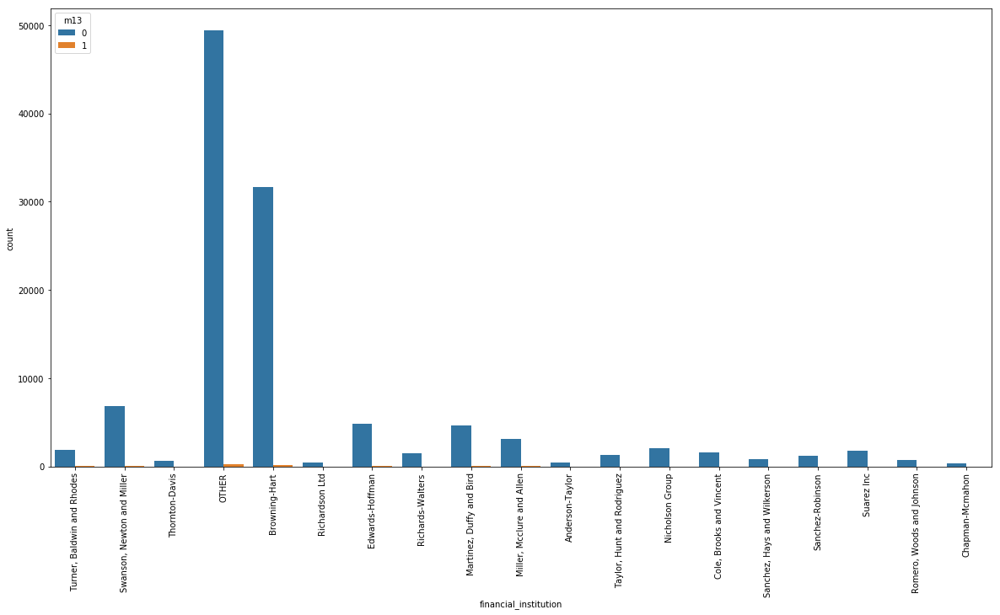

In [11]:
plt.figure(figsize=(20, 10))
sns.countplot(x="financial_institution", hue="m13", data=df)
plt.xticks(rotation =90)

In [14]:
pd.crosstab(df['financial_institution'],df.m13,normalize='index')

m13,0,1
financial_institution,,
Anderson-Taylor,0.993789,0.006211
Browning-Hart,0.994506,0.005494
Chapman-Mcmahon,1.000000,0.000000
"Cole, Brooks and Vincent",0.992692,0.007308
Edwards-Hoffman,0.991559,0.008441
"Martinez, Duffy and Bird",0.995122,0.004878
"Miller, Mcclure and Allen",0.993984,0.006016
Nicholson Group,0.994802,0.005198
OTHER,0.994587,0.005413


In [18]:

df['interest_rate'].describe()

count    116058.000000
mean          3.868961
std           0.461020
min           2.250000
25%           3.500000
50%           3.875000
75%           4.125000
max           6.750000
Name: interest_rate, dtype: float64

In [19]:
#box = plt.boxplot(df['unpaid_principal_bal']);
df['unpaid_principal_bal'].describe()

count    1.160580e+05
mean     2.082262e+05
std      1.146851e+05
min      1.100000e+04
25%      1.200000e+05
50%      1.830000e+05
75%      2.780000e+05
max      1.200000e+06
Name: unpaid_principal_bal, dtype: float64

In [20]:

df['loan_term'].describe()

count    116058.000000
mean        292.280997
std          89.762415
min          60.000000
25%         180.000000
50%         360.000000
75%         360.000000
max         360.000000
Name: loan_term, dtype: float64

In [22]:


df['loan_to_value'].describe()

count    116058.000000
mean         67.431939
std          17.291719
min           6.000000
25%          57.000000
50%          72.000000
75%          80.000000
max          97.000000
Name: loan_to_value, dtype: float64

In [24]:
# Standard plotly imports
import plotly.plotly as py
import plotly.graph_objs as go
from plotly.offline import iplot, init_notebook_mode
# Using plotly + cufflinks in offline mode
import cufflinks
cufflinks.go_offline(connected=True)
init_notebook_mode(connected=True)

In [25]:
df.pivot(columns='m13', values='loan_to_value').iplot(
kind='box',
yTitle='Loan to Value',
title='Loan to value vs Loan deliquency')

(array([0, 1]), <a list of 2 Text xticklabel objects>)

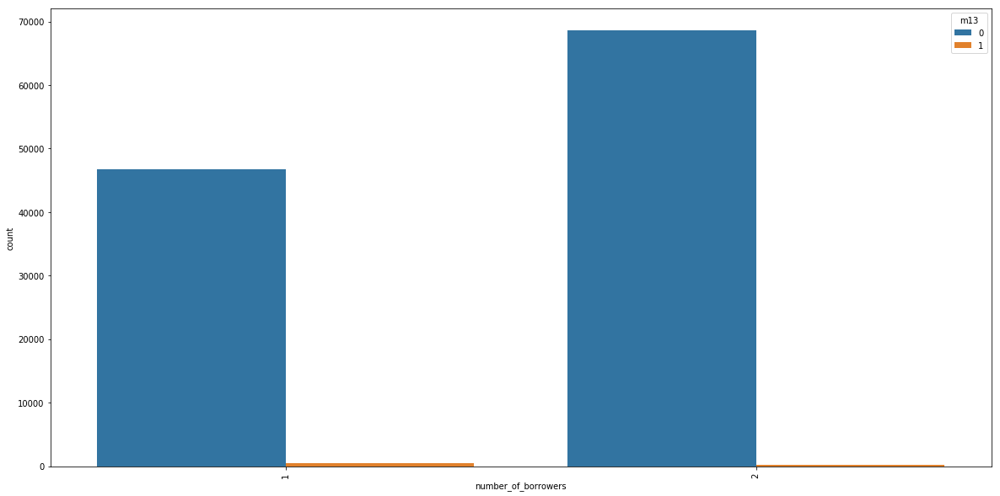

In [29]:
plt.figure(figsize=(20, 10))
sns.countplot(x="number_of_borrowers", hue="m13", data=df)
plt.xticks(rotation =90)

In [30]:
pd.crosstab(df['number_of_borrowers'],df.m13,normalize='index')

m13,0,1
number_of_borrowers,,
1,0.990956,0.009044
2,0.996964,0.003036


In [31]:
df.pivot(columns='m13', values='debt_to_income_ratio').iplot(
kind='box',
yTitle='debt_to_income_ratio',
title='Debt to income_ratio vs Loan deliquency')

In [32]:
df.pivot(columns='m13', values='borrower_credit_score').iplot(
kind='box',
yTitle='borrower_credit_score',
title='Borrower credit_score vs Loan deliquency')

(array([0, 1, 2]), <a list of 3 Text xticklabel objects>)

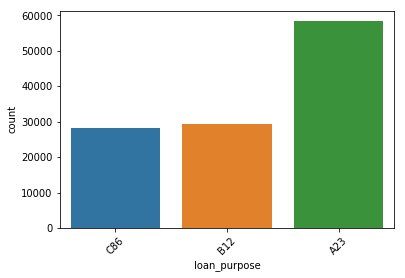

In [33]:

sns.countplot(x="loan_purpose", data=df)
plt.xticks(rotation =45)

(array([0, 1]), <a list of 2 Text xticklabel objects>)

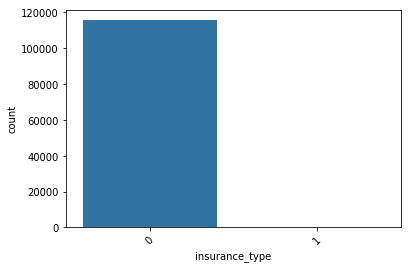

In [34]:

sns.countplot(x="insurance_type", data=df)
plt.xticks(rotation =45)

# EDA inference
The count of X source is the highest among X,Y,Z

Others followed by Browning Hart has the highest no of loans disbursed.

Turner, Baldwin and Rhodes Followed by Cole, Brooks and Vincent have higher delinquency with respect to the loan disbursed.

Minimum loan term is 60 days and the maximum term is 360 days.

Minimum intrest is 2.25 and maximum rate is 6.75

Loan to value - The loan-to-value (LTV) ratio is a financial term used by lenders to express the ratio of a loan to the valueof an asset purchased. A loan with a lower LTV ratio is less of a risk for the lender. The min LTV is 6 and the max is 97

The default rate of loans with a single borrower is  3 times more than two borrowers 

The debt-to-income (DTI) ratio is the percentage of your gross monthly income that goes to paying your monthly debt payments.A low DTI ratio demonstrates a good balance between debt and income. The debt to income ratio of Deliquent loan is from 10 to 50 whereas for non delinquent it is from 0 to 64.

The highest no of loans are given for A23 category 

Majority of the loan have no insurance


# Data cleaning

In [35]:
df['m1'].value_counts()

0    115729
1       293
2        30
3         6
Name: m1, dtype: int64

On looking at the Month 1 record we can see that 36 records 
have the 2 or 3 which is not possible as the M1 is the first month of loan payment. As the no of records are less than .1% of total records we can drop it 

In [36]:

df.drop(df[df['m1'] > 1].index, inplace = True)

In [37]:
df.m1.value_counts()

0    115729
1       293
Name: m1, dtype: int64

Delinquency count

In [38]:
df.m13.value_counts()

0    115390
1       632
Name: m13, dtype: int64

# Feature engineering

In [39]:
df['No of deliquent months max'] = df[['m1','m2','m3','m4','m5','m6','m7','m8','m9','m10','m11','m12']].max(axis=1)

In [40]:
df['Credit Score-Max'] = df[['borrower_credit_score','co-borrower_credit_score']].max(axis=1)

In [41]:
df['interest_rate.BINS']=pd.cut(df['interest_rate'],5,labels=['A','B','C','D','F']).astype(np.object)

In [42]:
df['unpaid_principal_bal.BINS']=pd.cut(df['unpaid_principal_bal'],4,labels=['A','B','C','D']).astype(np.object)

In [43]:
df['Debt to income.BINS']=pd.cut(df['debt_to_income_ratio'],3,labels=['Low','Medium','High']).astype(np.object)

In [44]:
df['Value of Loan']=df['unpaid_principal_bal']/df['loan_to_value']

In [45]:
df['loan_term.BINS']=pd.cut(df['loan_term'],3,labels=['A','B','C']).astype(np.object)

In [46]:
df.head()

,loan_id,source,financial_institution,interest_rate,unpaid_principal_bal,loan_term,origination_date,first_payment_date,loan_to_value,number_of_borrowers,...,m11,m12,m13,No of deliquent months max,Credit Score-Max,interest_rate.BINS,unpaid_principal_bal.BINS,Debt to income.BINS,Value of Loan,loan_term.BINS
0,2.680550e+11,Z,"Turner, Baldwin and Rhodes",4.250,214000,360,01/03/2012,May-12,95,1,...,0,0,1,1,694,C,A,Low,2252.631579,C
1,6.728320e+11,Y,"Swanson, Newton and Miller",4.875,144000,360,01/01/2012,Mar-12,72,1,...,1,0,1,1,697,C,A,High,2000.000000,C
2,7.425150e+11,Z,Thornton-Davis,3.250,366000,180,01/01/2012,Mar-12,49,1,...,0,0,1,0,780,B,B,Medium,7469.387755,B
3,6.013860e+11,X,OTHER,4.750,135000,360,01/02/2012,Apr-12,46,2,...,1,1,1,1,638,C,A,High,2934.782609,C
4,2.738700e+11,X,OTHER,4.750,124000,360,01/02/2012,Apr-12,80,1,...,10,11,1,11,681,C,A,Medium,1550.000000,C


In [47]:
df1=df.copy(deep=True)

In [48]:
df1.head()

,loan_id,source,financial_institution,interest_rate,unpaid_principal_bal,loan_term,origination_date,first_payment_date,loan_to_value,number_of_borrowers,...,m11,m12,m13,No of deliquent months max,Credit Score-Max,interest_rate.BINS,unpaid_principal_bal.BINS,Debt to income.BINS,Value of Loan,loan_term.BINS
0,2.680550e+11,Z,"Turner, Baldwin and Rhodes",4.250,214000,360,01/03/2012,May-12,95,1,...,0,0,1,1,694,C,A,Low,2252.631579,C
1,6.728320e+11,Y,"Swanson, Newton and Miller",4.875,144000,360,01/01/2012,Mar-12,72,1,...,1,0,1,1,697,C,A,High,2000.000000,C
2,7.425150e+11,Z,Thornton-Davis,3.250,366000,180,01/01/2012,Mar-12,49,1,...,0,0,1,0,780,B,B,Medium,7469.387755,B
3,6.013860e+11,X,OTHER,4.750,135000,360,01/02/2012,Apr-12,46,2,...,1,1,1,1,638,C,A,High,2934.782609,C
4,2.738700e+11,X,OTHER,4.750,124000,360,01/02/2012,Apr-12,80,1,...,10,11,1,11,681,C,A,Medium,1550.000000,C


In [49]:

df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 116022 entries, 0 to 116057
Data columns (total 36 columns):
loan_id                       116022 non-null float64
source                        116022 non-null object
financial_institution         116022 non-null object
interest_rate                 116022 non-null float64
unpaid_principal_bal          116022 non-null int64
loan_term                     116022 non-null int64
origination_date              116022 non-null object
first_payment_date            116022 non-null object
loan_to_value                 116022 non-null int64
number_of_borrowers           116022 non-null int64
debt_to_income_ratio          116022 non-null int64
borrower_credit_score         116022 non-null int64
loan_purpose                  116022 non-null object
insurance_percent             116022 non-null int64
co-borrower_credit_score      116022 non-null int64
insurance_type                116022 non-null int64
m1                            116022 non-null in

In [50]:
df1[['source','financial_institution','loan_purpose','interest_rate.BINS','unpaid_principal_bal.BINS','Debt to income.BINS','loan_term.BINS']] = df1[['source','financial_institution','loan_purpose','interest_rate.BINS','unpaid_principal_bal.BINS','Debt to income.BINS','loan_term.BINS']] .astype('category')

In [51]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 116022 entries, 0 to 116057
Data columns (total 36 columns):
loan_id                       116022 non-null float64
source                        116022 non-null category
financial_institution         116022 non-null category
interest_rate                 116022 non-null float64
unpaid_principal_bal          116022 non-null int64
loan_term                     116022 non-null int64
origination_date              116022 non-null object
first_payment_date            116022 non-null object
loan_to_value                 116022 non-null int64
number_of_borrowers           116022 non-null int64
debt_to_income_ratio          116022 non-null int64
borrower_credit_score         116022 non-null int64
loan_purpose                  116022 non-null category
insurance_percent             116022 non-null int64
co-borrower_credit_score      116022 non-null int64
insurance_type                116022 non-null int64
m1                            116022 non-n

In [52]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 116022 entries, 0 to 116057
Data columns (total 36 columns):
loan_id                       116022 non-null float64
source                        116022 non-null category
financial_institution         116022 non-null category
interest_rate                 116022 non-null float64
unpaid_principal_bal          116022 non-null int64
loan_term                     116022 non-null int64
origination_date              116022 non-null object
first_payment_date            116022 non-null object
loan_to_value                 116022 non-null int64
number_of_borrowers           116022 non-null int64
debt_to_income_ratio          116022 non-null int64
borrower_credit_score         116022 non-null int64
loan_purpose                  116022 non-null category
insurance_percent             116022 non-null int64
co-borrower_credit_score      116022 non-null int64
insurance_type                116022 non-null int64
m1                            116022 non-n

In [53]:
df1['m13']=df1['m13'].astype('category')

In [54]:
df1[['origination_date','first_payment_date']]=df1[['origination_date','first_payment_date']].astype('category')

In [55]:
df1.head()

,loan_id,source,financial_institution,interest_rate,unpaid_principal_bal,loan_term,origination_date,first_payment_date,loan_to_value,number_of_borrowers,...,m11,m12,m13,No of deliquent months max,Credit Score-Max,interest_rate.BINS,unpaid_principal_bal.BINS,Debt to income.BINS,Value of Loan,loan_term.BINS
0,2.680550e+11,Z,"Turner, Baldwin and Rhodes",4.250,214000,360,01/03/2012,May-12,95,1,...,0,0,1,1,694,C,A,Low,2252.631579,C
1,6.728320e+11,Y,"Swanson, Newton and Miller",4.875,144000,360,01/01/2012,Mar-12,72,1,...,1,0,1,1,697,C,A,High,2000.000000,C
2,7.425150e+11,Z,Thornton-Davis,3.250,366000,180,01/01/2012,Mar-12,49,1,...,0,0,1,0,780,B,B,Medium,7469.387755,B
3,6.013860e+11,X,OTHER,4.750,135000,360,01/02/2012,Apr-12,46,2,...,1,1,1,1,638,C,A,High,2934.782609,C
4,2.738700e+11,X,OTHER,4.750,124000,360,01/02/2012,Apr-12,80,1,...,10,11,1,11,681,C,A,Medium,1550.000000,C


In [56]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 116022 entries, 0 to 116057
Data columns (total 36 columns):
loan_id                       116022 non-null float64
source                        116022 non-null category
financial_institution         116022 non-null category
interest_rate                 116022 non-null float64
unpaid_principal_bal          116022 non-null int64
loan_term                     116022 non-null int64
origination_date              116022 non-null category
first_payment_date            116022 non-null category
loan_to_value                 116022 non-null int64
number_of_borrowers           116022 non-null int64
debt_to_income_ratio          116022 non-null int64
borrower_credit_score         116022 non-null int64
loan_purpose                  116022 non-null category
insurance_percent             116022 non-null int64
co-borrower_credit_score      116022 non-null int64
insurance_type                116022 non-null int64
m1                            116022 n

In [57]:
df1.isnull().sum()

loan_id                       0
source                        0
financial_institution         0
interest_rate                 0
unpaid_principal_bal          0
loan_term                     0
origination_date              0
first_payment_date            0
loan_to_value                 0
number_of_borrowers           0
debt_to_income_ratio          0
borrower_credit_score         0
loan_purpose                  0
insurance_percent             0
co-borrower_credit_score      0
insurance_type                0
m1                            0
m2                            0
m3                            0
m4                            0
m5                            0
m6                            0
m7                            0
m8                            0
m9                            0
m10                           0
m11                           0
m12                           0
m13                           0
No of deliquent months max    0
Credit Score-Max              0
interest

# Model building 

In [58]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
df_categorical = df1.select_dtypes(include=['category'])

In [59]:
df_categorical = df_categorical.apply(le.fit_transform)
df_categorical.head()

,source,financial_institution,origination_date,first_payment_date,loan_purpose,m13,interest_rate.BINS,unpaid_principal_bal.BINS,Debt to income.BINS,loan_term.BINS
0,2,18,2,3,2,1,2,0,1,2
1,1,15,0,2,1,1,2,0,0,2
2,2,17,0,2,1,1,1,1,2,1
3,0,8,1,0,1,1,2,0,0,2
4,0,8,1,0,2,1,2,0,2,2


In [60]:
# concat df_categorical with original df
df1 = df1.drop(df_categorical.columns, axis=1)
df1 = pd.concat([df1, df_categorical], axis=1)
df1.head()

,loan_id,interest_rate,unpaid_principal_bal,loan_term,loan_to_value,number_of_borrowers,debt_to_income_ratio,borrower_credit_score,insurance_percent,co-borrower_credit_score,...,source,financial_institution,origination_date,first_payment_date,loan_purpose,m13,interest_rate.BINS,unpaid_principal_bal.BINS,Debt to income.BINS,loan_term.BINS
0,2.680550e+11,4.250,214000,360,95,1,22,694,30,0,...,2,18,2,3,2,1,2,0,1,2
1,6.728320e+11,4.875,144000,360,72,1,44,697,0,0,...,1,15,0,2,1,1,2,0,0,2
2,7.425150e+11,3.250,366000,180,49,1,33,780,0,0,...,2,17,0,2,1,1,1,1,2,1
3,6.013860e+11,4.750,135000,360,46,2,44,633,0,638,...,0,8,1,0,1,1,2,0,0,2
4,2.738700e+11,4.750,124000,360,80,1,43,681,0,0,...,0,8,1,0,2,1,2,0,2,2


In [61]:
X=df1.drop(['m13','loan_id'],axis=1)
y=df1.m13

In [62]:
X.columns

Index(['interest_rate', 'unpaid_principal_bal', 'loan_term', 'loan_to_value',
       'number_of_borrowers', 'debt_to_income_ratio', 'borrower_credit_score',
       'insurance_percent', 'co-borrower_credit_score', 'insurance_type', 'm1',
       'm2', 'm3', 'm4', 'm5', 'm6', 'm7', 'm8', 'm9', 'm10', 'm11', 'm12',
       'No of deliquent months max', 'Credit Score-Max', 'Value of Loan',
       'source', 'financial_institution', 'origination_date',
       'first_payment_date', 'loan_purpose', 'interest_rate.BINS',
       'unpaid_principal_bal.BINS', 'Debt to income.BINS', 'loan_term.BINS'],
      dtype='object')

In [63]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 116022 entries, 0 to 116057
Data columns (total 34 columns):
interest_rate                 116022 non-null float64
unpaid_principal_bal          116022 non-null int64
loan_term                     116022 non-null int64
loan_to_value                 116022 non-null int64
number_of_borrowers           116022 non-null int64
debt_to_income_ratio          116022 non-null int64
borrower_credit_score         116022 non-null int64
insurance_percent             116022 non-null int64
co-borrower_credit_score      116022 non-null int64
insurance_type                116022 non-null int64
m1                            116022 non-null int64
m2                            116022 non-null int64
m3                            116022 non-null int64
m4                            116022 non-null int64
m5                            116022 non-null int64
m6                            116022 non-null int64
m7                            116022 non-null int64
m8 

# Oversampling 

In [64]:
from imblearn.over_sampling import SMOTE

Using TensorFlow backend.


In [65]:
X, y = SMOTE().fit_resample(X, y)

In [66]:
from collections import Counter
print(sorted(Counter(y).items()))

[(0, 115390), (1, 115390)]


# Building a base model

In [67]:
import lightgbm as lgb
from lightgbm import LGBMModel,LGBMClassifier

In [68]:
lgbm = LGBMClassifier(objective='binary', random_state=0,n_estimators=100,max_depth=6,learning_rate=.2,num_leaves=16,reg_alpha=100,reg_lambda=5)

In [69]:
lgbm.fit(X,y)



LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.2, max_depth=6,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=16, objective='binary',
               random_state=0, reg_alpha=100, reg_lambda=5, silent=True,
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)

# Predicting with test data 

In [70]:
df3=pd.read_csv('test.csv')

In [71]:
df3.head()

,loan_id,source,financial_institution,interest_rate,unpaid_principal_bal,loan_term,origination_date,first_payment_date,loan_to_value,number_of_borrowers,...,m3,m4,m5,m6,m7,m8,m9,m10,m11,m12
0,1,Y,Browning-Hart,3.875,417000,360,01/02/12,Apr-12,75,1,...,0,0,0,0,0,0,0,0,0,0
1,2,X,OTHER,4.500,113000,360,01/02/12,Apr-12,80,2,...,0,0,0,0,0,0,0,0,0,0
2,3,Y,OTHER,4.500,72000,360,01/01/12,Mar-12,75,1,...,0,0,0,0,0,0,0,0,0,0
3,4,X,"Miller, Mcclure and Allen",4.125,123000,180,01/02/12,Apr-12,41,2,...,0,0,0,0,0,0,0,0,0,0
4,5,X,Browning-Hart,3.250,166000,180,01/02/12,Apr-12,53,2,...,0,0,0,0,0,0,0,0,0,0


In [72]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35866 entries, 0 to 35865
Data columns (total 28 columns):
loan_id                     35866 non-null int64
source                      35866 non-null object
financial_institution       35866 non-null object
interest_rate               35866 non-null float64
unpaid_principal_bal        35866 non-null int64
loan_term                   35866 non-null int64
origination_date            35866 non-null object
first_payment_date          35866 non-null object
loan_to_value               35866 non-null int64
number_of_borrowers         35866 non-null int64
debt_to_income_ratio        35866 non-null int64
borrower_credit_score       35866 non-null int64
loan_purpose                35866 non-null object
insurance_percent           35866 non-null int64
co-borrower_credit_score    35866 non-null int64
insurance_type              35866 non-null int64
m1                          35866 non-null int64
m2                          35866 non-null int64
m3

In [73]:
df3['interest_rate.BINS']=pd.cut(df3['interest_rate'],5,labels=['A','B','C','D','F']).astype(np.object)

In [74]:
df3['Debt to income.BINS']=pd.cut(df3['debt_to_income_ratio'],3,labels=['Low','Medium','High']).astype(np.object)
df3['unpaid_principal_bal.BINS']=pd.cut(df3['unpaid_principal_bal'],4,labels=['A','B','C','D']).astype(np.object)
df3['loan_term.BINS']=pd.cut(df3['loan_term'],3,labels=['A','B','C']).astype(np.object)

In [75]:
df3['Value of Loan']=df3['unpaid_principal_bal']/df3['loan_to_value']

In [76]:
df_categorical = df3.select_dtypes(include=['object'])

In [77]:
df_categorical = df_categorical.apply(le.fit_transform)
df_categorical.head()

,source,financial_institution,origination_date,first_payment_date,loan_purpose,interest_rate.BINS,Debt to income.BINS,unpaid_principal_bal.BINS,loan_term.BINS
0,1,1,1,0,0,1,2,2,2
1,0,8,1,0,2,2,2,0,2
2,1,8,0,2,2,2,2,0,2
3,0,6,1,0,0,2,2,0,1
4,0,1,1,0,0,1,1,0,1


In [78]:
# concat df_categorical with original df
df3 = df3.drop(df_categorical.columns, axis=1)
df3 = pd.concat([df3, df_categorical], axis=1)

In [79]:
df3['No of deliquent months max'] = df3[['m1','m2','m3','m4','m5','m6','m7','m8','m9','m10','m11','m12']].max(axis=1)

In [80]:
df3['Credit Score-Max'] = df3[['borrower_credit_score','co-borrower_credit_score']].max(axis=1)

In [81]:
X=df3.drop(['loan_id'],axis=1)

In [82]:
X.columns

Index(['interest_rate', 'unpaid_principal_bal', 'loan_term', 'loan_to_value',
       'number_of_borrowers', 'debt_to_income_ratio', 'borrower_credit_score',
       'insurance_percent', 'co-borrower_credit_score', 'insurance_type', 'm1',
       'm2', 'm3', 'm4', 'm5', 'm6', 'm7', 'm8', 'm9', 'm10', 'm11', 'm12',
       'Value of Loan', 'source', 'financial_institution', 'origination_date',
       'first_payment_date', 'loan_purpose', 'interest_rate.BINS',
       'Debt to income.BINS', 'unpaid_principal_bal.BINS', 'loan_term.BINS',
       'No of deliquent months max', 'Credit Score-Max'],
      dtype='object')

In [83]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35866 entries, 0 to 35865
Data columns (total 34 columns):
interest_rate                 35866 non-null float64
unpaid_principal_bal          35866 non-null int64
loan_term                     35866 non-null int64
loan_to_value                 35866 non-null int64
number_of_borrowers           35866 non-null int64
debt_to_income_ratio          35866 non-null int64
borrower_credit_score         35866 non-null int64
insurance_percent             35866 non-null int64
co-borrower_credit_score      35866 non-null int64
insurance_type                35866 non-null int64
m1                            35866 non-null int64
m2                            35866 non-null int64
m3                            35866 non-null int64
m4                            35866 non-null int64
m5                            35866 non-null int64
m6                            35866 non-null int64
m7                            35866 non-null int64
m8                    

In [84]:
X=X[['interest_rate', 'unpaid_principal_bal', 'loan_term', 'loan_to_value',
       'number_of_borrowers', 'debt_to_income_ratio', 'borrower_credit_score',
       'insurance_percent', 'co-borrower_credit_score', 'insurance_type', 'm1',
       'm2', 'm3', 'm4', 'm5', 'm6', 'm7', 'm8', 'm9', 'm10', 'm11', 'm12',
       'No of deliquent months max', 'Credit Score-Max', 'Value of Loan',
       'source', 'financial_institution', 'origination_date',
       'first_payment_date', 'loan_purpose', 'interest_rate.BINS',
       'unpaid_principal_bal.BINS', 'Debt to income.BINS', 'loan_term.BINS']]

In [85]:
X.columns

Index(['interest_rate', 'unpaid_principal_bal', 'loan_term', 'loan_to_value',
       'number_of_borrowers', 'debt_to_income_ratio', 'borrower_credit_score',
       'insurance_percent', 'co-borrower_credit_score', 'insurance_type', 'm1',
       'm2', 'm3', 'm4', 'm5', 'm6', 'm7', 'm8', 'm9', 'm10', 'm11', 'm12',
       'No of deliquent months max', 'Credit Score-Max', 'Value of Loan',
       'source', 'financial_institution', 'origination_date',
       'first_payment_date', 'loan_purpose', 'interest_rate.BINS',
       'unpaid_principal_bal.BINS', 'Debt to income.BINS', 'loan_term.BINS'],
      dtype='object')

In [86]:
prediction1 = lgbm.predict(X)

In [87]:
prediction1[0:50]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0], dtype=int64)

In [88]:
df3['m13']=prediction1

In [89]:
df3.head()

,loan_id,interest_rate,unpaid_principal_bal,loan_term,loan_to_value,number_of_borrowers,debt_to_income_ratio,borrower_credit_score,insurance_percent,co-borrower_credit_score,...,origination_date,first_payment_date,loan_purpose,interest_rate.BINS,Debt to income.BINS,unpaid_principal_bal.BINS,loan_term.BINS,No of deliquent months max,Credit Score-Max,m13
0,1,3.875,417000,360,75,1,20,790,0,0,...,1,0,0,1,2,2,2,0,790,0
1,2,4.500,113000,360,80,2,33,793,0,784,...,1,0,2,2,2,0,2,0,793,0
2,3,4.500,72000,360,75,1,34,710,0,0,...,0,2,2,2,2,0,2,0,710,0
3,4,4.125,123000,180,41,2,24,798,0,813,...,1,0,0,2,2,0,1,0,813,0
4,5,3.250,166000,180,53,2,12,767,0,768,...,1,0,0,1,1,0,1,0,768,0


In [90]:
submission = df3[['loan_id','m13']] 
submission.to_csv('Submission.csv', index=False)